In [1]:
import time

import gymnasium as gym
import numpy as np

#from stable_baselines3 import A2C
from stable_baselines3.common.vec_env import DummyVecEnv, SubprocVecEnv
from stable_baselines3.common.utils import set_random_seed
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.env_util import make_vec_env

libEGL warning: failed to open /dev/dri/renderD129: Permission denied

libEGL warning: failed to open /dev/dri/renderD129: Permission denied

libEGL warning: failed to open /dev/dri/renderD128: Permission denied

libEGL warning: failed to open /dev/dri/renderD128: Permission denied



In [2]:
from typing import Callable


def make_env(env_id: str, rank: int, seed: int = 0) -> Callable:
    """
    Utility function for multiprocessed env.

    :param env_id: (str) the environment ID
    :param num_env: (int) the number of environment you wish to have in subprocesses
    :param seed: (int) the inital seed for RNG
    :param rank: (int) index of the subprocess
    :return: (Callable)
    """

    def _init() -> gym.Env:
        env = gym.make(env_id, render_mode='rgb_array', reward_type='sparse', max_episode_steps=50)
        env.reset(seed=seed + rank)
        return env

    set_random_seed(seed)
    return _init

In [3]:
env_id = 'FetchPickAndPlace-v2'
num_cpu = 32

vec_env = make_vec_env(env_id, n_envs=num_cpu)

#model = A2C("MlpPolicy", vec_env, verbose=0)

In [4]:
import gymnasium as gym
import numpy as np

class SeededFetchPickAndPlaceEnv(gym.Wrapper):
    def __init__(self, env, seed=None):
        super().__init__(env)
        self.seed = seed

    def reset(self, seed=None, options=None):
        obs, info = self.env.reset(seed=self.seed)
        return obs, info

    def seed(self, seed=None):
        self.np_random, seed = np.random.SeedSequence(seed)
        return [seed]

# Usage:
#env = gym.make('FetchPickAndPlace-v2')
#wrapped_env = SeededFetchPickAndPlaceEnv(env, 959)


In [ ]:
def env_creator(env_config={}):
    import gymnasium as gym
    env = gym.make('FetchPickAndPlace-v2', render_mode='rgb_array', reward_type='dense', max_episode_steps=50)
    env = SeededFetchPickAndPlaceEnv(env, 960)
    env.reset()
    return env

In [ ]:
from stable_baselines3 import HerReplayBuffer, DDPG, DQN, SAC, TD3
from stable_baselines3.her.goal_selection_strategy import GoalSelectionStrategy
from stable_baselines3.common.envs import BitFlippingEnv

model_class = SAC  # works also with SAC, DDPG and TD3
N_BITS = 15

#env = env_creator({})#BitFlippingEnv(n_bits=N_BITS, continuous=model_class in [DDPG, SAC, TD3], max_steps=N_BITS)

# Available strategies (cf paper): future, final, episode
goal_selection_strategy = "future" # equivalent to GoalSelectionStrategy.FUTURE

# Initialize the model
model = model_class(
    "MultiInputPolicy",
    vec_env,
    replay_buffer_class=HerReplayBuffer,
    # Parameters for HER
    replay_buffer_kwargs=dict(
        n_sampled_goal=4,
        goal_selection_strategy=goal_selection_strategy,
    ),
    learning_starts=3500,
    batch_size=256,
    verbose=1,
    learning_rate=0.001,
    #action_noise
    tensorboard_log="../R3L-LOGS/Ftch-PickAndPlace-32-MPI"
)

# Train the model
model.learn(20000000)

model.save("./her_Fetch-PickAndPlace-Multi-Task_Sparse_32-MPI_env")
# Because it needs access to `env.compute_reward()`
# HER must be loaded with the env
model = model_class.load("./her_Fetch-PickAndPlace-Multi-Task_Sparse_32-MPI_env", env=env)

obs, info = env.reset()
for _ in range(100):
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, terminated, truncated, _ = env.step(action)
    if terminated or truncated:
        obs, info = env.reset()

Using cuda device
Logging to ../R3L-LOGS/Ftch-PickAndPlace-32-MPI/SAC_2
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -46.9    |
|    success_rate    | 0.0625   |
| time/              |          |
|    episodes        | 4        |
|    fps             | 876      |
|    time_elapsed    | 1        |
|    total_timesteps | 1600     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -46.9    |
|    success_rate    | 0.0625   |
| time/              |          |
|    episodes        | 8        |
|    fps             | 875      |
|    time_elapsed    | 1        |
|    total_timesteps | 1600     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -46.9    |
|    success_rate    | 0.0625   |
| time/   

/home/lunet/cocp5/anaconda3/envs/R3L-server03/lib/python3.9/site-packages/gymnasium/core.py:297: UserWarning: WARN: env.compute_reward to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.compute_reward` for environment variables or `env.get_attr('compute_reward')` that will search the reminding wrappers.
  logger.warn(


------------------------------------
| rollout/           |             |
|    ep_len_mean     | 50          |
|    ep_rew_mean     | -47.1       |
|    success_rate    | 0.052083332 |
| time/              |             |
|    episodes        | 68          |
|    fps             | 760         |
|    time_elapsed    | 6           |
|    total_timesteps | 4800        |
| train/             |             |
|    actor_loss      | -5.49       |
|    critic_loss     | 0.253       |
|    ent_coef        | 0.962       |
|    ent_coef_loss   | -0.263      |
|    learning_rate   | 0.001       |
|    n_updates       | 40          |
------------------------------------
------------------------------------
| rollout/           |             |
|    ep_len_mean     | 50          |
|    ep_rew_mean     | -47.1       |
|    success_rate    | 0.052083332 |
| time/              |             |
|    episodes        | 72          |
|    fps             | 760         |
|    time_elapsed    | 6           |
|

In [ ]:
import matplotlib.pyplot as plt
from IPython import display as ipythondisplay
img = plt.imshow(env.render())

obs, info = env.reset()
for _ in range(200):
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, terminated, truncated, _ = env.step(action)
    if terminated or truncated:
        obs, info = env.reset()
    img.set_data(env.render()) # Just update the data
    ipythondisplay.display(plt.gcf())
    ipythondisplay.clear_output(wait=True)

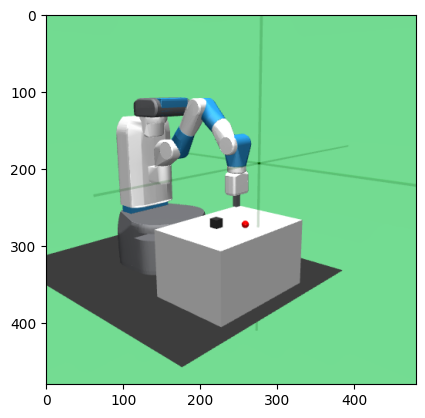

In [9]:
import matplotlib.pyplot as plt
from IPython import display as ipythondisplay

# Get the first environment from the vectorized environments
single_env = vec_env.envs[0]

img = plt.imshow(single_env.render())

obs, info = single_env.reset()
for _ in range(200):
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, terminated, truncated, _ = single_env.step(action)
    if terminated or truncated:
        obs, info = single_env.reset()
    img.set_data(single_env.render()) # Just update the data
    ipythondisplay.display(plt.gcf())
    ipythondisplay.clear_output(wait=True)
